51
100
105
256


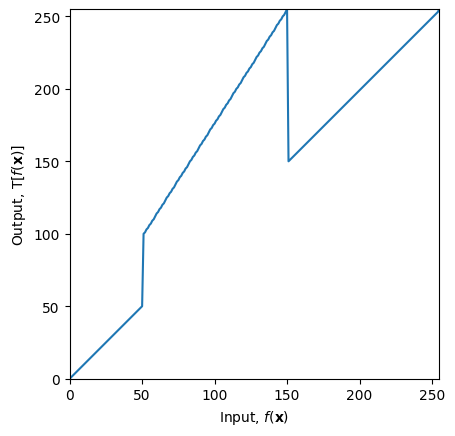

In [6]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

c = np.array([(50, 50), (50, 100), (150, 255), (150, 150)])

t1 = np.linspace(0, c[0,1], c[0,0] + 1 - 0).astype('uint8')
print(len(t1))
t2 = np.linspace(c[1,1], c[2,1], c[2,0] - c[1,0]).astype('uint8')
print(len(t2))
t3 = np.linspace(c[3,1], 255, 255 - c[3,0]).astype('uint8')
print(len(t3))

transform = np.concatenate((t1, t2), axis=0).astype('uint8')
transform = np.concatenate((transform, t3), axis=0).astype('uint8')
print(len(transform))

fig, ax = plt.subplots()
ax.plot(transform)
ax.set_xlabel(r'Input, $f(\mathbf{x})$')
ax.set_ylabel('Output, $\mathrm{T}[f(\mathbf{x})]$')
ax.set_xlim(0,255)
ax.set_ylim(0,255)
ax.set_aspect('equal')
plt.show()

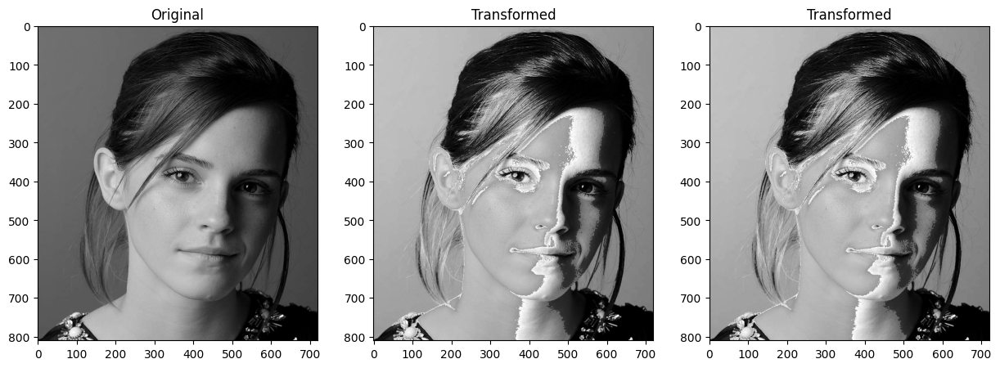

In [11]:
img_orig = cv.imread('emma.jpg', cv.IMREAD_GRAYSCALE)

f = img_orig.copy()
img_trans = cv.LUT(f, transform)
img_trans2 = transform[f]

fig, ax = plt.subplots(1, 3, figsize=(15,5))
ax[0].imshow(img_orig, cmap='gray', vmin=0, vmax=255)
ax[1].imshow(img_trans, cmap='gray', vmin=0, vmax=255)
ax[2].imshow(img_trans2, cmap='gray', vmin=0, vmax=255)
ax[0].set_title('Original')
ax[1].set_title('Transformed')
ax[2].set_title('Transformed')
plt.show()

191
65
256
[  0   0   0   0 190 191]
191
65
256
[187 188 189 190   0   0]


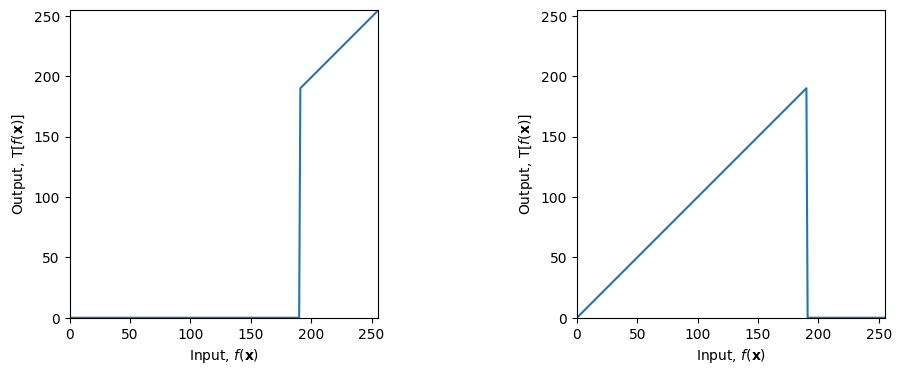

In [180]:
threshold = 190

t1 = np.linspace(0, 0, threshold+1).astype('uint8')
print(len(t1))
t2 = np.linspace(threshold, 255, 255-threshold).astype('uint8')
print(len(t2))

transform_white = np.concatenate((t1, t2), axis=0).astype('uint8')
print(len(transform_white))

print(transform_white[threshold-3:threshold+3])

t1 = np.linspace(0, threshold, threshold+1).astype('uint8')
print(len(t1))
t2 = np.linspace(0, 0, 255-threshold).astype('uint8')
print(len(t2))

transform_gray = np.concatenate((t1, t2), axis=0).astype('uint8')
print(len(transform_gray))

print(transform_gray[threshold-3:threshold+3])

fig, ax = plt.subplots(1,2, figsize=(12,4))
ax[0].plot(transform_white)
ax[1].plot(transform_gray)
ax[0].set_xlabel(r'Input, $f(\mathbf{x})$')
ax[0].set_ylabel('Output, $\mathrm{T}[f(\mathbf{x})]$')
ax[1].set_xlabel(r'Input, $f(\mathbf{x})$')
ax[1].set_ylabel('Output, $\mathrm{T}[f(\mathbf{x})]$')
ax[0].set_xlim(0,255)
ax[0].set_ylim(0,255)
ax[0].set_aspect('equal')
ax[1].set_xlim(0,255)
ax[1].set_ylim(0,255)
ax[1].set_aspect('equal')
plt.show()

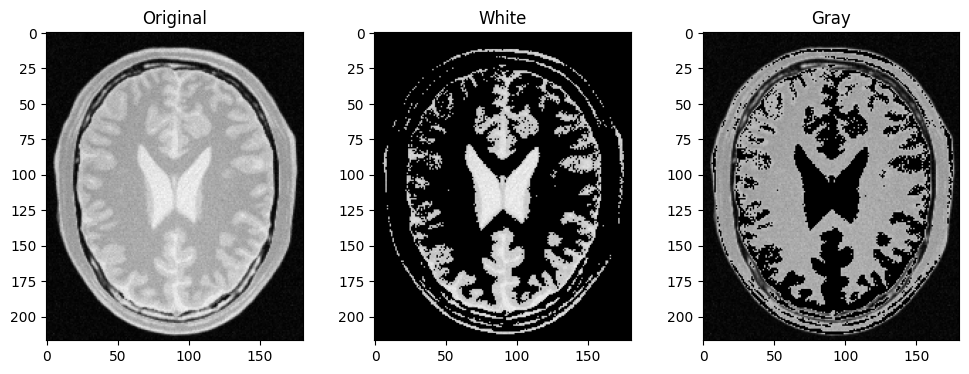

In [181]:
img = cv.imread('brain_proton_density_slice.png', cv.IMREAD_GRAYSCALE)

white_img = cv.LUT(img, transform_white)
gray_img = cv.LUT(img, transform_gray)

fig, ax = plt.subplots(1,3, figsize=(12,4))
ax[0].imshow(img, cmap='gray', vmin=0, vmax=255)
ax[1].imshow(white_img, cmap='gray', vmin=0, vmax=255)
ax[2].imshow(gray_img, cmap='gray', vmin=0, vmax=255)
ax[0].set_title('Original')
ax[1].set_title('White')
ax[2].set_title('Gray')
plt.show()


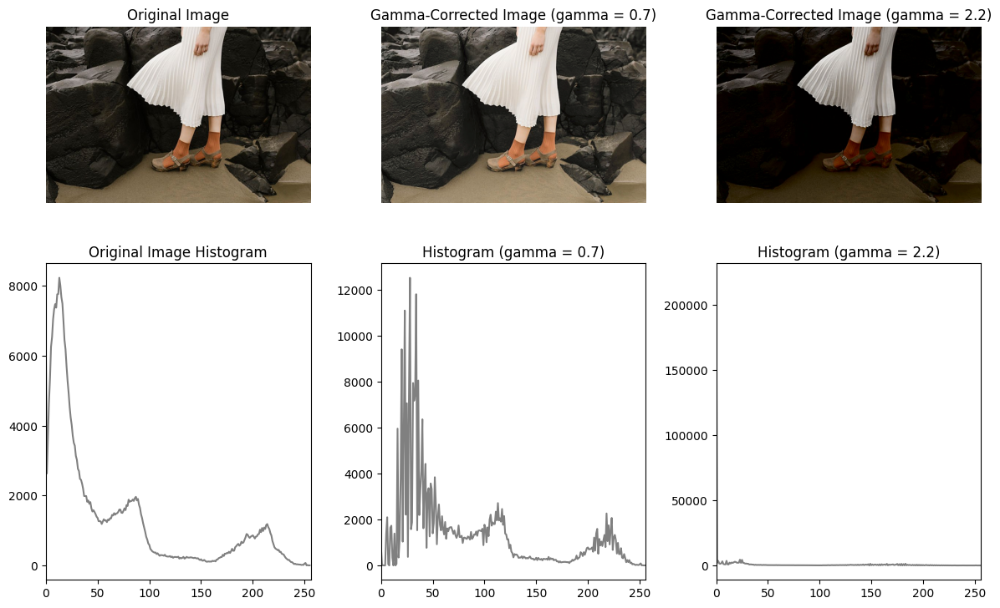

In [185]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

#0.7
image_path = 'highlights_and_shadows.jpg'
f = cv.imread(image_path)

image_lab = cv.cvtColor(f, cv.COLOR_BGR2Lab)
L = image_lab[:, :, 0]

gamma = 0.7
t = np.array([(i / 255.0) ** gamma * 255 for i in np.arange(0, 256)]).astype(np.uint8)

L_corrected = cv.LUT(L, t)

image_lab[:, :, 0] = L_corrected
corrected_image = cv.cvtColor(image_lab, cv.COLOR_Lab2BGR)

original_hist = cv.calcHist([f], [0], None, [256], [0, 256])
corrected_hist = cv.calcHist([corrected_image], [0], None, [256], [0, 256])

#2.2
image_path = 'highlights_and_shadows.jpg'
f = cv.imread(image_path)

image_lab = cv.cvtColor(f, cv.COLOR_BGR2Lab)
L = image_lab[:, :, 0]

gamma = 2.2
t = np.array([(i / 255.0) ** gamma * 255 for i in np.arange(0, 256)]).astype(np.uint8)

L_corrected_2 = cv.LUT(L, t)

image_lab[:, :, 0] = L_corrected_2
corrected_image_2 = cv.cvtColor(image_lab, cv.COLOR_Lab2BGR)

original_hist = cv.calcHist([f], [0], None, [256], [0, 256])
corrected_hist_2 = cv.calcHist([corrected_image_2], [0], None, [256], [0, 256])


#figures
plt.figure(figsize=(12, 8))

plt.subplot(2, 3, 1)
plt.title('Original Image')
plt.imshow(cv.cvtColor(f, cv.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(2, 3, 2)
plt.title('Gamma-Corrected Image (gamma = 0.7)')
plt.imshow(cv.cvtColor(corrected_image, cv.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(2, 3, 3)
plt.title('Gamma-Corrected Image (gamma = 2.2)')
plt.imshow(cv.cvtColor(corrected_image_2, cv.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(2, 3, 4)
plt.title('Original Image Histogram')
plt.plot(original_hist, color='gray')
plt.xlim([0, 256])

plt.subplot(2, 3, 5)
plt.title('Histogram (gamma = 0.7)')
plt.plot(corrected_hist, color='gray')
plt.xlim([0, 256])

plt.subplot(2, 3, 6)
plt.title('Histogram (gamma = 2.2)')
plt.plot(corrected_hist_2, color='gray')
plt.xlim([0, 256])

plt.tight_layout()
plt.show()



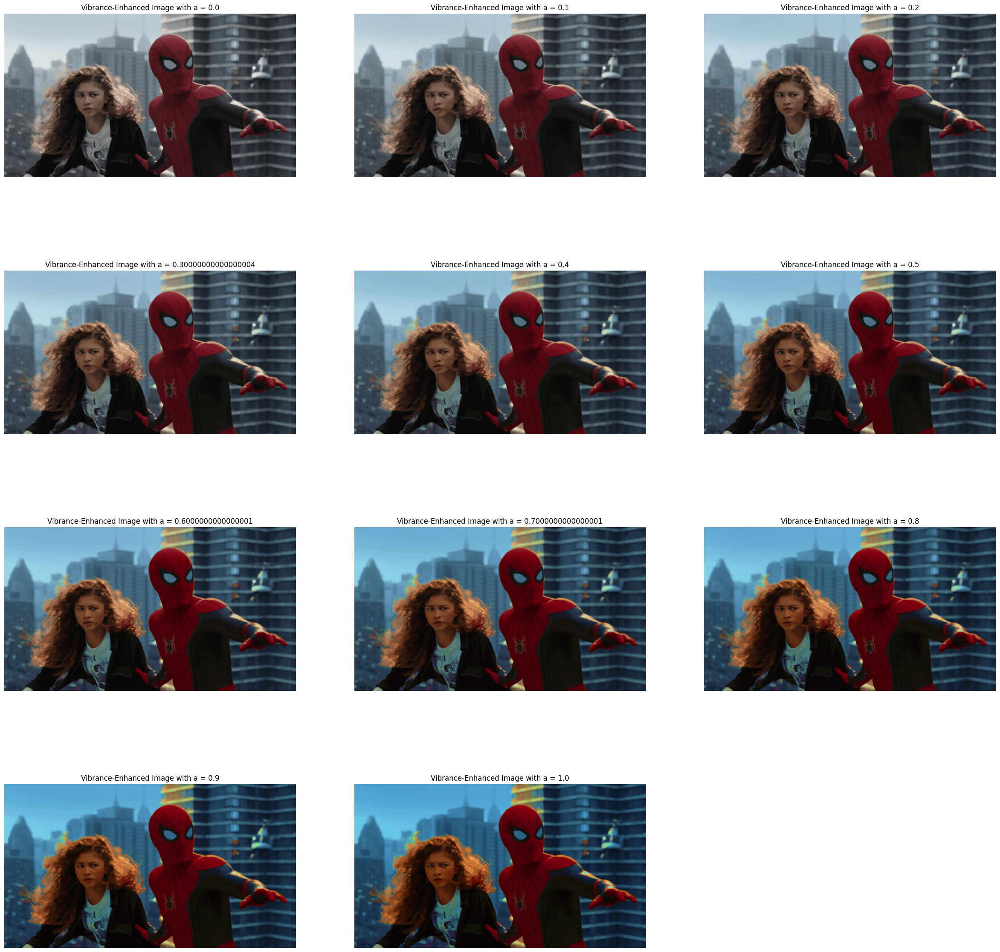

In [186]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


def vibrance_transform(saturation, a, sigma=70):
    transformed = saturation + a * 128 * np.exp(-((saturation - 128) ** 2) / (2 * sigma ** 2))
    return np.clip(transformed, 0, 255)

# Read the image
image = cv2.imread('spider.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Split the image into HSV
hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
h, s, v = cv2.split(hsv_image)

# Apply the intensity transformation to the saturation plane
A = np.linspace(0,1.0,11)

plt.figure(figsize=(30,30))
for i, a in enumerate(A): #Use enumerate to get both index and value
    s_transformed = vibrance_transform(s, a)
    # Recombine the planes
    hsv_transformed = cv2.merge([h, s_transformed.astype(np.uint8), v])
    vibrant_image = cv2.cvtColor(hsv_transformed, cv2.COLOR_HSV2RGB)

    plt.subplot(4, 3, i+1) # Use i (the index) for subplot positioning
    plt.title(f'Vibrance-Enhanced Image with a = {a}') # Use f-string for title formatting
    plt.imshow(vibrant_image)
    plt.axis('off')




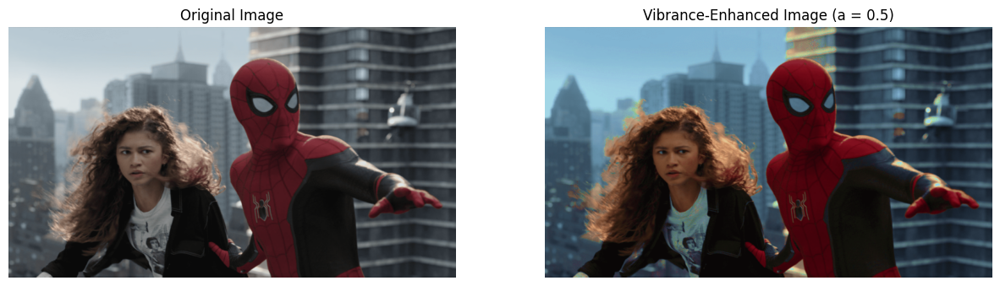

In [188]:
# Apply the intensity transformation to the saturation plane
a = 0.5
s_transformed = vibrance_transform(s, a)

# Recombine the planes
hsv_transformed = cv2.merge([h, s_transformed.astype(np.uint8), v])
vibrant_image = cv2.cvtColor(hsv_transformed, cv2.COLOR_HSV2RGB)

# Display results
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Vibrance-Enhanced Image (a = 0.5)')
plt.imshow(vibrant_image)
plt.axis('off')

plt.show()

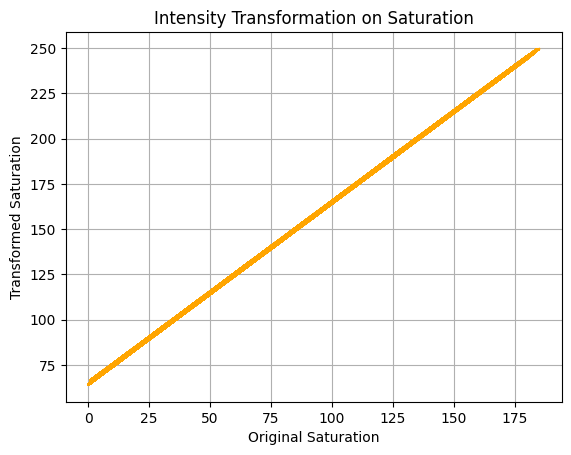

In [189]:
# Plot the original and transformed saturation planes
fig, ax = plt.subplots()
plt.title('Intensity Transformation on Saturation')
plt.plot(s.flatten(), vibrance_transform(s.flatten(), a), color='orange')
plt.xlabel('Original Saturation')
plt.ylabel('Transformed Saturation')
plt.grid()
plt.show()

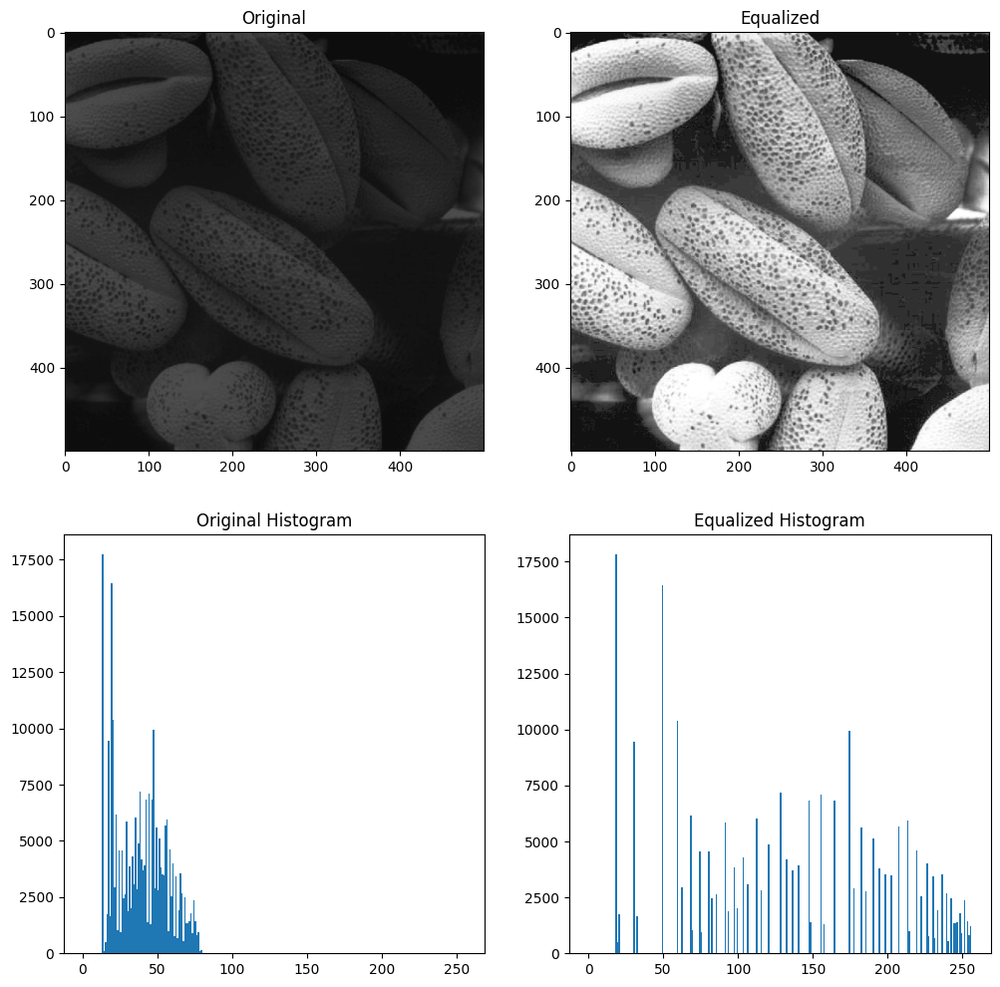

In [77]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

def hist_equalizer(image):
  m, n = image.shape
  hist, bins = np.histogram(image.flatten(), 256, [0, 256])
  cdf = hist.cumsum()
  factor = (256-1) / (m*n)
  equalized_hist = np.round(factor * cdf).astype(np.uint8)
  equalized_image = equalized_hist[image]
  return equalized_image

img = cv.imread('shells.tif', cv.IMREAD_GRAYSCALE)
equalized_img = hist_equalizer(img)

fig, ax = plt.subplots(2,2, figsize=(12,12))
ax[0,0].imshow(img, cmap='gray', vmin=0, vmax=255)
ax[0,1].imshow(equalized_img, cmap='gray', vmin=0, vmax=255)
ax[0,0].set_title('Original')
ax[0,1].set_title('Equalized')
ax[1,0].hist(img.flatten(), 256, [0, 256])
ax[1,1].hist(equalized_img.flatten(), 256, [0, 256])
ax[1,0].set_title('Original Histogram')
ax[1,1].set_title('Equalized Histogram')
plt.show()

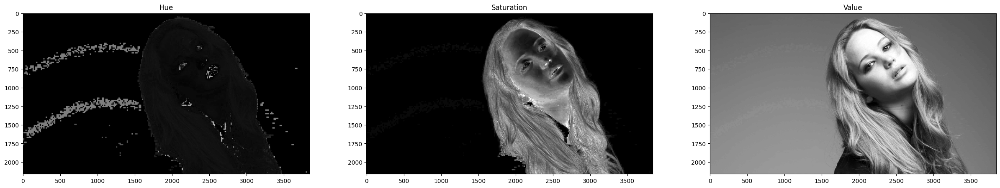

In [143]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('jeniffer.jpg')
hsv_image = cv.cvtColor(img, cv.COLOR_BGR2HSV)
h, s, v = cv.split(hsv_image)

fig, ax = plt.subplots(1,3, figsize=(30,30))
ax[0].imshow(h, cmap='gray', vmin=0, vmax=255)
ax[1].imshow(s, cmap='gray', vmin=0, vmax=255)
ax[2].imshow(v, cmap='gray', vmin=0, vmax=255)
ax[0].set_title('Hue')
ax[1].set_title('Saturation')
ax[2].set_title('Value')
plt.show()


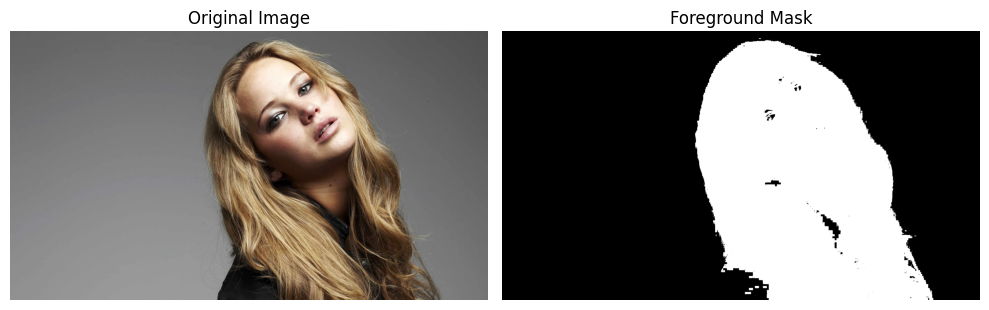

In [165]:
# Threshold the Value plane to create a binary mask
# _, foreground_mask = cv.threshold(s, 15, 255, cv.THRESH_BINARY)
foreground_mask = s >15

# Display the original image and the mask
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(foreground_mask, cmap='gray')
plt.title('Foreground Mask')
plt.axis('off')

plt.tight_layout()
plt.show()

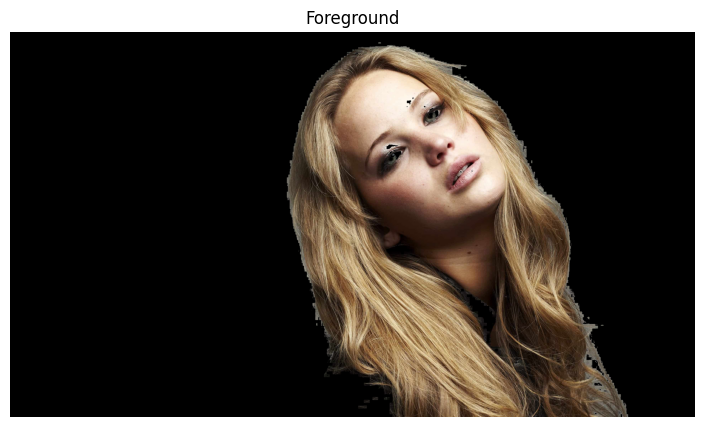

In [166]:
# Obtain the foreground using bitwise_and
foreground = cv.bitwise_and(img, img, mask=foreground_mask.astype(np.uint8))
plt.figure(figsize=(10, 5))
plt.imshow(cv.cvtColor(foreground, cv.COLOR_BGR2RGB))
plt.title('Foreground')
plt.axis('off')
plt.show()


In [167]:
foreground_hist_blue = cv.calcHist([foreground], [0], foreground_mask.astype(np.uint8), [256], [0, 256])
foreground_hist_green = cv.calcHist([foreground], [1], foreground_mask.astype(np.uint8), [256], [0, 256])
foreground_hist_red = cv.calcHist([foreground], [2], foreground_mask.astype(np.uint8), [256], [0, 256])

cum_hist_blue = np.cumsum(foreground_hist_blue)
cum_hist_green = np.cumsum(foreground_hist_green)
cum_hist_red = np.cumsum(foreground_hist_red)


def equalize_histogram(cum_hist, pixel_count):
    return ((cum_hist / pixel_count) * 255).astype(np.uint8)

pixel_count = foreground_mask.astype(np.uint8).sum()

# Histogram equalization
equalized_foreground_blue = equalize_histogram(cum_hist_blue, pixel_count)
equalized_foreground_green = equalize_histogram(cum_hist_green, pixel_count)
equalized_foreground_red = equalize_histogram(cum_hist_red, pixel_count)

# Apply equalization to foreground
equalized_foreground = np.zeros_like(foreground)
equalized_foreground[:,:,0] = cv2.LUT(foreground[:,:,0], equalized_foreground_blue)
equalized_foreground[:,:,1] = cv2.LUT(foreground[:,:,1], equalized_foreground_green)
equalized_foreground[:,:,2] = cv2.LUT(foreground[:,:,2], equalized_foreground_red)


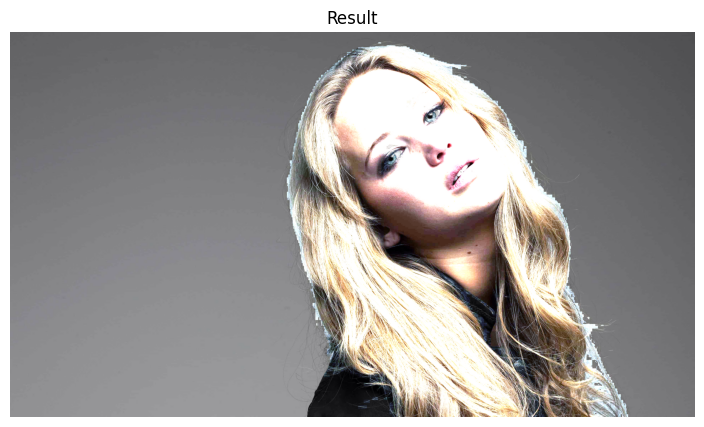

In [168]:
# Extract the background using the inverse of the mask
background_mask = cv.bitwise_not(foreground_mask.astype(np.uint8))
background = cv.bitwise_and(img, img, mask=cv.bitwise_not(foreground_mask.astype(np.uint8)))

# Display equalized foreground
result = cv2.add(equalized_foreground, background)

# Display result
plt.figure(figsize=(10, 5))
plt.imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB))
plt.title('Result')
plt.axis('off')
plt.show()

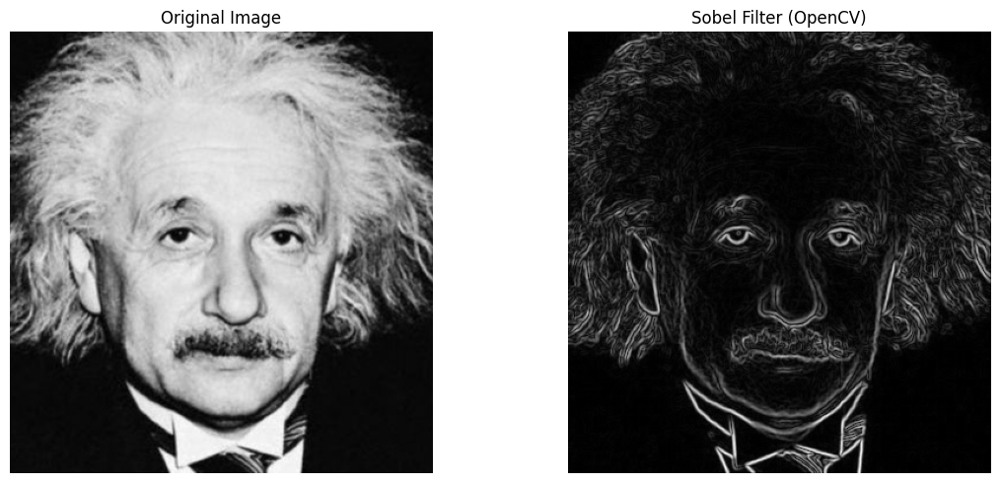

In [169]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('einstein.png', cv2.IMREAD_GRAYSCALE)  # Load as grayscale

# (a) Use the existing filter2D to Sobel filter the image
sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)  # Sobel in the x-direction
sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)  # Sobel in the y-direction
sobel_combined = np.sqrt(sobel_x**2 + sobel_y**2)  # Magnitude

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Sobel Filter (OpenCV)')
plt.imshow(sobel_combined, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

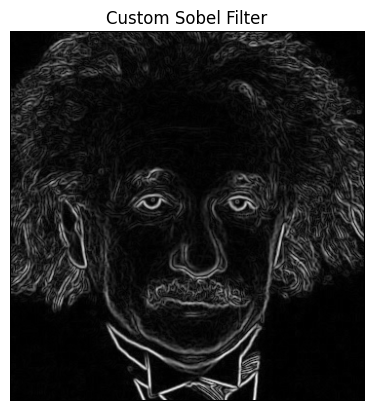

In [119]:
def sobel_filter(img):
    # Define Sobel kernels
    sobel_x = np.array([[1, 0, -1],
                         [2, 0, -2],
                         [1, 0, -1]])

    sobel_y = np.array([[1, 2, 1],
                         [0, 0, 0],
                         [-1, -2, -1]])

    # Get image dimensions
    rows, cols = img.shape
    output_x = np.zeros_like(img, dtype=np.float64)
    output_y = np.zeros_like(img, dtype=np.float64)

    # Apply convolution with Sobel kernels
    for i in range(1, rows-1):
        for j in range(1, cols-1):
            region = img[i-1:i+2, j-1:j+2]
            output_x[i, j] = np.sum(sobel_x * region)
            output_y[i, j] = np.sum(sobel_y * region)

    # Calculate the magnitude
    magnitude = np.sqrt(output_x**2 + output_y**2)
    return magnitude

# Apply custom Sobel filter
custom_sobel = sobel_filter(image)

plt.subplot()
plt.title('Custom Sobel Filter')
plt.imshow(custom_sobel, cmap='gray')
plt.axis('off')
plt.show()

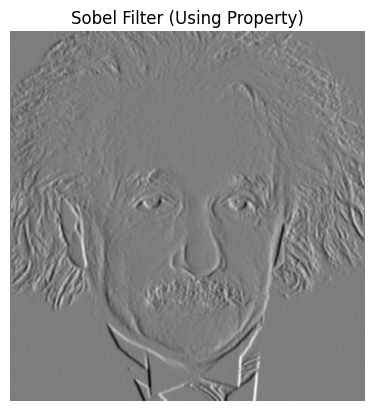

In [120]:
def sobel_filter_property(img):
    # Define the combined Sobel filter
    kernel = np.array([[1, 0, -1],
                       [2, 0, -2],
                       [1, 0, -1]])

    # Apply convolution using the property
    output = cv2.filter2D(img, cv2.CV_64F, kernel)
    return output

# Apply Sobel filter using the property
property_sobel = sobel_filter_property(image)

plt.subplot()
plt.title('Sobel Filter (Using Property)')
plt.imshow(property_sobel, cmap='gray')
plt.axis('off')
plt.show()


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def zoom_image(image, zoom_factor, method='nearest'):
    # Get original dimensions
    original_height, original_width = image.shape[:2]

    # Calculate new dimensions
    new_height = int(original_height * zoom_factor)
    new_width = int(original_width * zoom_factor)

    # Resize the image based on the chosen interpolation method
    if method == 'nearest':
        zoomed_image = cv2.resize(image, (new_width, new_height), interpolation=cv2.INTER_NEAREST)
    elif method == 'bilinear':
        zoomed_image = cv2.resize(image, (new_width, new_height), interpolation=cv2.INTER_LINEAR)
    else:
        raise ValueError("Invalid method. Choose 'nearest' or 'bilinear'.")

    return zoomed_image

# Load the image
image_path = 'path/to/image.jpg'  # Replace with your image path
image = cv2.imread(image_path)

# Zoom factors to test
zoom_factors = [0.5, 1.5, 2.0, 5.0]  # Example zoom factors in (0, 10]

# Create a subplot to display the original and zoomed images
plt.figure(figsize=(12, 8))

# Original Image
plt.subplot(3, 4, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

# Apply zoom for each factor and both methods
for i, zoom_factor in enumerate(zoom_factors):
    # Nearest-neighbor interpolation
    nearest_zoomed = zoom_image(image, zoom_factor, method='nearest')

    # Bilinear interpolation
    bilinear_zoomed = zoom_image(image, zoom_factor, method='bilinear')

    # Display Nearest-neighbor zoomed image
    plt.subplot(3, 4, 2 * (i + 1))
    plt.title(f'Nearest Neighbor (Zoom: {zoom_factor})')
    plt.imshow(cv2.cvtColor(nearest_zoomed, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    # Display Bilinear zoomed image
    plt.subplot(3, 4, 2 * (i + 1) + 1)
    plt.title(f'Bilinear (Zoom: {zoom_factor})')
    plt.imshow(cv2.cvtColor(bilinear_zoomed, cv2.COLOR_BGR2RGB))
    plt.axis('off')

plt.tight_layout()
plt.show()


Nearest-Neighbor Interpolation - Normalized SSD for Image 1: 31.2546
Nearest-Neighbor Interpolation - Normalized SSD for Image 2: 11.9340
Bilinear Interpolation - Normalized SSD for Image 1: 30.9825
Bilinear Interpolation - Normalized SSD for Image 2: 10.6752


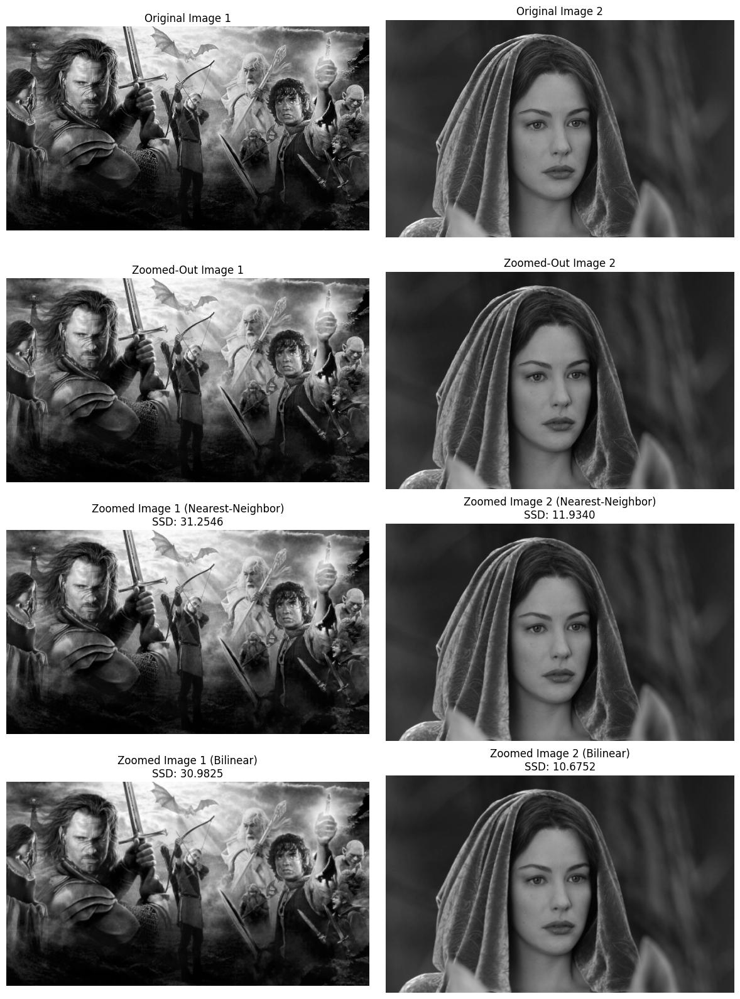

In [175]:
import cv2
import numpy as np

def zoom_image(image, scale_factor, interpolation='nearest'):
    if interpolation == 'nearest':
        zoomed_image = cv2.resize(image, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_NEAREST)
    elif interpolation == 'bilinear':
        zoomed_image = cv2.resize(image, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
    else:
        raise ValueError("Interpolation must be 'nearest' or 'bilinear'")
    return zoomed_image

def compute_normalized_ssd(original, zoomed):
    if original.shape != zoomed.shape:
        raise ValueError("Both images must have the same dimensions to compute SSD")

    ssd = np.sum((original - zoomed) ** 2)
    norm_ssd = ssd / float(original.size)
    return norm_ssd

# Load images
original_image1 = cv2.imread('a1q5images/im01.png', cv2.IMREAD_GRAYSCALE)
zoomed_out_image1 = cv2.imread('a1q5images/im01small.png', cv2.IMREAD_GRAYSCALE)

original_image2 = cv2.imread('a1q5images/im02.png', cv2.IMREAD_GRAYSCALE)
zoomed_out_image2 = cv2.imread('a1q5images/im02small.png', cv2.IMREAD_GRAYSCALE)

# Define the scale factor
scale_factor = 4

# Zoom images back up using nearest-neighbor interpolation
zoomed_nn_image1 = zoom_image(zoomed_out_image1, scale_factor, interpolation='nearest')
zoomed_nn_image2 = zoom_image(zoomed_out_image2, scale_factor, interpolation='nearest')

# Compute normalized SSD for nearest-neighbor interpolation
ssd_nn_image1 = compute_normalized_ssd(original_image1, zoomed_nn_image1)
ssd_nn_image2 = compute_normalized_ssd(original_image2, zoomed_nn_image2)

print(f"Nearest-Neighbor Interpolation - Normalized SSD for Image 1: {ssd_nn_image1:.4f}")
print(f"Nearest-Neighbor Interpolation - Normalized SSD for Image 2: {ssd_nn_image2:.4f}")

# Zoom images back up using bilinear interpolation
zoomed_bilinear_image1 = zoom_image(zoomed_out_image1, scale_factor, interpolation='bilinear')
zoomed_bilinear_image2 = zoom_image(zoomed_out_image2, scale_factor, interpolation='bilinear')

# Compute normalized SSD for bilinear interpolation
ssd_bilinear_image1 = compute_normalized_ssd(original_image1, zoomed_bilinear_image1)
ssd_bilinear_image2 = compute_normalized_ssd(original_image2, zoomed_bilinear_image2)

print(f"Bilinear Interpolation - Normalized SSD for Image 1: {ssd_bilinear_image1:.4f}")
print(f"Bilinear Interpolation - Normalized SSD for Image 2: {ssd_bilinear_image2:.4f}")

# Plot the images
fig, axs = plt.subplots(4, 2, figsize=(12, 16))

# Original images
axs[0, 0].imshow(original_image1, cmap='gray')
axs[0, 0].set_title("Original Image 1")
axs[0, 0].axis('off')

axs[0, 1].imshow(original_image2, cmap='gray')
axs[0, 1].set_title("Original Image 2")
axs[0, 1].axis('off')

# Zoomed-out images
axs[1, 0].imshow(zoomed_out_image1, cmap='gray')
axs[1, 0].set_title("Zoomed-Out Image 1")
axs[1, 0].axis('off')

axs[1, 1].imshow(zoomed_out_image2, cmap='gray')
axs[1, 1].set_title("Zoomed-Out Image 2")
axs[1, 1].axis('off')

# Zoomed-back images using nearest-neighbor interpolation
axs[2, 0].imshow(zoomed_nn_image1, cmap='gray')
axs[2, 0].set_title(f"Zoomed Image 1 (Nearest-Neighbor)\nSSD: {ssd_nn_image1:.4f}")
axs[2, 0].axis('off')

axs[2, 1].imshow(zoomed_nn_image2, cmap='gray')
axs[2, 1].set_title(f"Zoomed Image 2 (Nearest-Neighbor)\nSSD: {ssd_nn_image2:.4f}")
axs[2, 1].axis('off')

# Zoomed-back images using bilinear interpolation
axs[3, 0].imshow(zoomed_bilinear_image1, cmap='gray')
axs[3, 0].set_title(f"Zoomed Image 1 (Bilinear)\nSSD: {ssd_bilinear_image1:.4f}")
axs[3, 0].axis('off')

axs[3, 1].imshow(zoomed_bilinear_image2, cmap='gray')
axs[3, 1].set_title(f"Zoomed Image 2 (Bilinear)\nSSD: {ssd_bilinear_image2:.4f}")
axs[3, 1].axis('off')

plt.tight_layout()
plt.show()


Nearest-Neighbor Interpolation - Normalized SSD for Image 1: 31.2843
Nearest-Neighbor Interpolation - Normalized SSD for Image 2: 11.9020
Bilinear Interpolation - Normalized SSD for Image 1: 31.0531
Bilinear Interpolation - Normalized SSD for Image 2: 10.6830


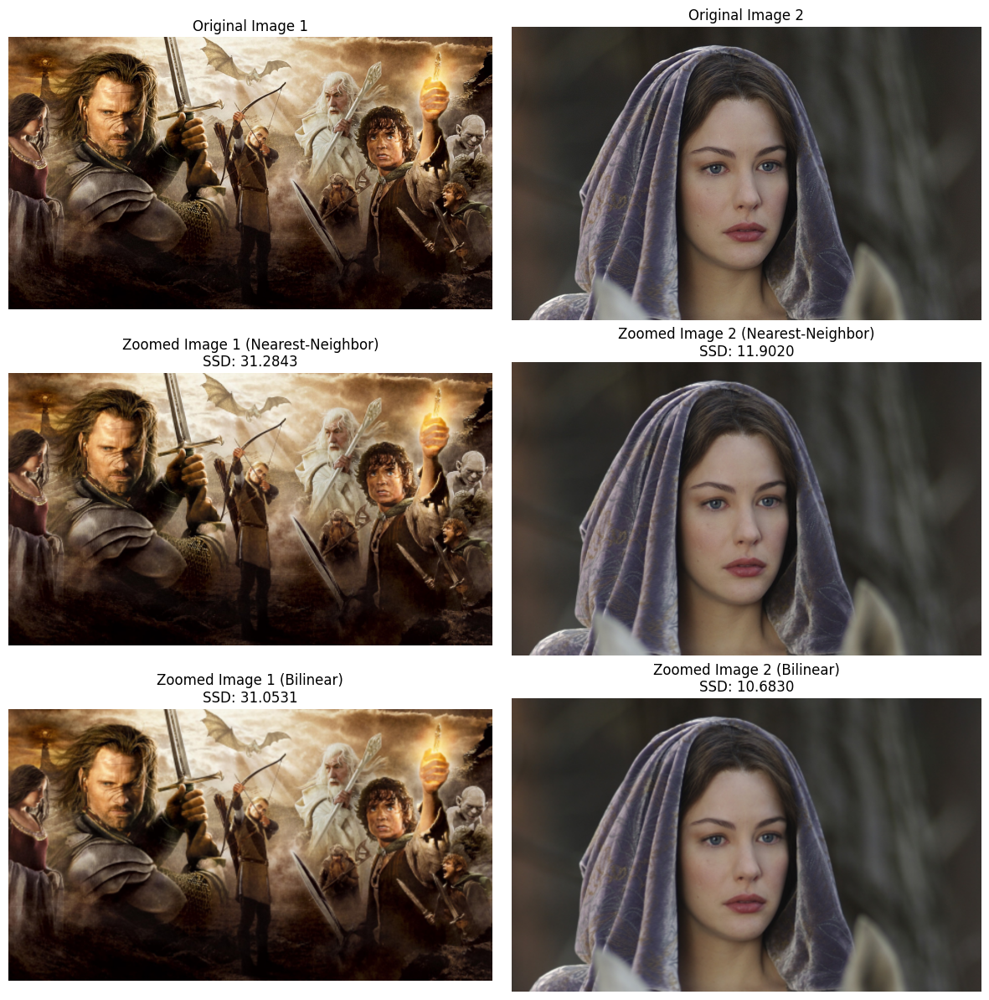

In [179]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def zoom_image(image, scale_factor, interpolation='nearest'):
    if interpolation == 'nearest':
        zoomed_image = cv2.resize(image, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_NEAREST)
    elif interpolation == 'bilinear':
        zoomed_image = cv2.resize(image, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
    else:
        raise ValueError("Interpolation must be 'nearest' or 'bilinear'")
    return zoomed_image

def compute_normalized_ssd(original, zoomed):
    if original.shape != zoomed.shape:
        raise ValueError("Both images must have the same dimensions to compute SSD")

    ssd = np.sum((original - zoomed) ** 2)
    norm_ssd = ssd / float(original.size)
    return norm_ssd


# Load images in color
original_image1 = cv2.imread('a1q5images/im01.png', cv2.IMREAD_COLOR)
zoomed_out_image1 = cv2.imread('a1q5images/im01small.png', cv2.IMREAD_COLOR)

original_image2 = cv2.imread('a1q5images/im02.png', cv2.IMREAD_COLOR)
zoomed_out_image2 = cv2.imread('a1q5images/im02small.png', cv2.IMREAD_COLOR)

# Convert images from BGR (OpenCV default) to RGB
original_image1 = cv2.cvtColor(original_image1, cv2.COLOR_BGR2RGB)
zoomed_out_image1 = cv2.cvtColor(zoomed_out_image1, cv2.COLOR_BGR2RGB)
original_image2 = cv2.cvtColor(original_image2, cv2.COLOR_BGR2RGB)
zoomed_out_image2 = cv2.cvtColor(zoomed_out_image2, cv2.COLOR_BGR2RGB)

# Define the scale factor
scale_factor = 4

# Zoom images back up using nearest-neighbor interpolation
zoomed_nn_image1 = zoom_image(zoomed_out_image1, scale_factor, interpolation='nearest')
zoomed_nn_image2 = zoom_image(zoomed_out_image2, scale_factor, interpolation='nearest')

# Compute normalized SSD for nearest-neighbor interpolation
ssd_nn_image1 = compute_normalized_ssd(original_image1, zoomed_nn_image1)
ssd_nn_image2 = compute_normalized_ssd(original_image2, zoomed_nn_image2)

print(f"Nearest-Neighbor Interpolation - Normalized SSD for Image 1: {ssd_nn_image1:.4f}")
print(f"Nearest-Neighbor Interpolation - Normalized SSD for Image 2: {ssd_nn_image2:.4f}")

# Zoom images back up using bilinear interpolation
zoomed_bilinear_image1 = zoom_image(zoomed_out_image1, scale_factor, interpolation='bilinear')
zoomed_bilinear_image2 = zoom_image(zoomed_out_image2, scale_factor, interpolation='bilinear')

# Compute normalized SSD for bilinear interpolation
ssd_bilinear_image1 = compute_normalized_ssd(original_image1, zoomed_bilinear_image1)
ssd_bilinear_image2 = compute_normalized_ssd(original_image2, zoomed_bilinear_image2)

print(f"Bilinear Interpolation - Normalized SSD for Image 1: {ssd_bilinear_image1:.4f}")
print(f"Bilinear Interpolation - Normalized SSD for Image 2: {ssd_bilinear_image2:.4f}")

# Plot the images
fig, axs = plt.subplots(3, 2, figsize=(12, 12))

# Original images
axs[0, 0].imshow(original_image1)
axs[0, 0].set_title("Original Image 1")
axs[0, 0].axis('off')

axs[0, 1].imshow(original_image2)
axs[0, 1].set_title("Original Image 2")
axs[0, 1].axis('off')

# Zoomed-back images using nearest-neighbor interpolation
axs[1, 0].imshow(zoomed_nn_image1)
axs[1, 0].set_title(f"Zoomed Image 1 (Nearest-Neighbor)\nSSD: {ssd_nn_image1:.4f}")
axs[1, 0].axis('off')

axs[1, 1].imshow(zoomed_nn_image2)
axs[1, 1].set_title(f"Zoomed Image 2 (Nearest-Neighbor)\nSSD: {ssd_nn_image2:.4f}")
axs[1, 1].axis('off')

# Zoomed-back images using bilinear interpolation
axs[2, 0].imshow(zoomed_bilinear_image1)
axs[2, 0].set_title(f"Zoomed Image 1 (Bilinear)\nSSD: {ssd_bilinear_image1:.4f}")
axs[2, 0].axis('off')

axs[2, 1].imshow(zoomed_bilinear_image2)
axs[2, 1].set_title(f"Zoomed Image 2 (Bilinear)\nSSD: {ssd_bilinear_image2:.4f}")
axs[2, 1].axis('off')

plt.tight_layout()
plt.show()


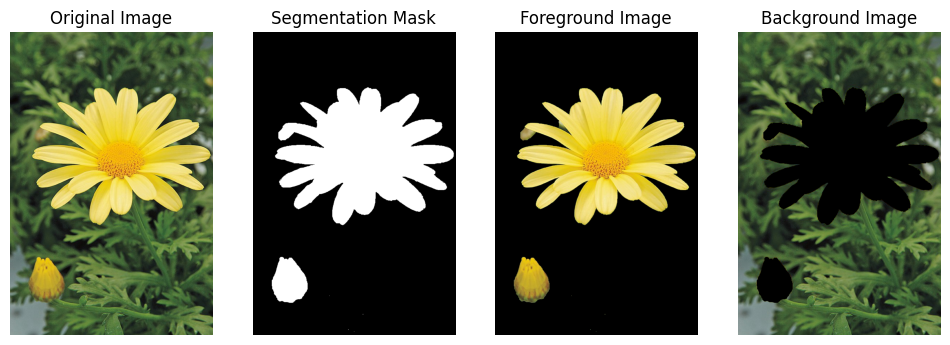

In [132]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

image = cv2.imread('daisy.jpg')
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Create initial mask
mask = np.zeros(image.shape[:2], np.uint8)

# Create background and foreground models
bgdModel = np.zeros((1, 65), np.float64)
fgdModel = np.zeros((1, 65), np.float64)

# Define the rectangle containing the foreground object (x, y, width, height)
rect = (50, 50, image.shape[1] - 50, image.shape[0] - 50)

# Apply the GrabCut algorithm
cv2.grabCut(image, mask, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_RECT)

# Modify mask such that sure background is 0, sure foreground is 1
final_mask = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')

# Extract foreground
foreground = image_rgb * final_mask[:, :, np.newaxis]

# Extract background by subtracting foreground from original
background_mask = np.where((final_mask == 0), 1, 0).astype('uint8')
background = image_rgb * background_mask[:, :, np.newaxis]

# Plotting the results
plt.figure(figsize=(12,10))

# Original image
plt.subplot(1, 4, 1)
plt.title('Original Image')
plt.imshow(image_rgb)
plt.axis('off')

# Segmentation mask
plt.subplot(1, 4, 2)
plt.title('Segmentation Mask')
plt.imshow(final_mask, cmap='gray')
plt.axis('off')

# Foreground image
plt.subplot(1, 4, 3)
plt.title('Foreground Image')
plt.imshow(foreground)
plt.axis('off')

# Background image
plt.subplot(1, 4, 4)
plt.title('Background Image')
plt.imshow(background)
plt.axis('off')

plt.show()

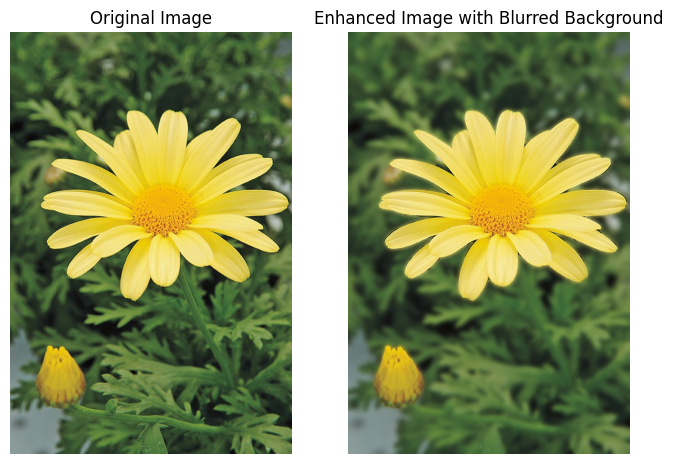

In [134]:
# Create a blurred version of the entire image
blurred_image = cv2.GaussianBlur(image_rgb, (25, 25), 0)

# Combine the foreground and blurred background
blurred_background = blurred_image * (1 - final_mask)[:, :, np.newaxis]
enhanced_image = cv2.add(foreground, blurred_background)

# Plotting the results
plt.figure(figsize=(8,8))

# Original image
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image_rgb)
plt.axis('off')

# Enhanced image with blurred background
plt.subplot(1, 2, 2)
plt.title('Enhanced Image with Blurred Background')
plt.imshow(enhanced_image)
plt.axis('off')

plt.show()